In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('music_data.csv')

In [3]:
df.head()

,Tempo,STE_mean,STE_std,RMS_mean,RMS_std,ZCR_mean,ZCR_std,Centroid_mean,Centroid_std,Bandwidth_mean,...,Chroma3_std,Chroma4_std,Chroma5_std,Chroma6_std,Chroma7_std,Chroma8_std,Chroma9_std,Chroma10_std,Chroma11_std,Genre
0,117.453835,0.002751,0.003669,0.046543,0.024123,0.084384,0.031907,1727.529519,662.830428,1796.181165,...,0.184830,0.251512,0.351089,0.188364,0.323224,0.192700,0.382898,0.313732,0.180709,choir
1,129.199219,0.002129,0.004041,0.036369,0.028344,0.073145,0.035295,1662.007492,623.339242,1851.467546,...,0.157749,0.278516,0.328153,0.221604,0.418387,0.204494,0.344287,0.273368,0.177349,choir
2,117.453835,0.003823,0.004734,0.055187,0.027815,0.087358,0.027223,1772.144912,565.937869,1780.848549,...,0.177687,0.215747,0.358452,0.233619,0.345665,0.211821,0.359942,0.316724,0.215014,choir
3,117.453835,0.002063,0.003362,0.037143,0.026085,0.081553,0.035328,1626.964701,560.037952,1726.384376,...,0.175896,0.229170,0.333000,0.220233,0.410388,0.211764,0.333863,0.271708,0.173406,choir
4,117.453835,0.003401,0.006337,0.048839,0.031819,0.081016,0.030548,1678.423017,618.512557,1778.342438,...,0.187950,0.220705,0.366815,0.208286,0.339201,0.195336,0.373781,0.308540,0.195019,choir


In [38]:
print("Liczba wierszy = ", df.shape[0])
print("Liczba kolumn = ", df.shape[1])
df.info()

Liczba wierszy =  1000
Liczba kolumn =  92
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 92 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Tempo           1000 non-null   float64
 1   STE_mean        1000 non-null   float64
 2   STE_std         1000 non-null   float64
 3   RMS_mean        1000 non-null   float64
 4   RMS_std         1000 non-null   float64
 5   ZCR_mean        1000 non-null   float64
 6   ZCR_std         1000 non-null   float64
 7   Centroid_mean   1000 non-null   float64
 8   Centroid_std    1000 non-null   float64
 9   Bandwidth_mean  1000 non-null   float64
 10  Bandwidth_std   1000 non-null   float64
 11  Roll-off_mean   1000 non-null   float64
 12  Roll-off_std    1000 non-null   float64
 13  Contrast0_mean  1000 non-null   float64
 14  Contrast1_mean  1000 non-null   float64
 15  Contrast2_mean  1000 non-null   float64
 16  Contrast3_mean  1000 non-null   floa

In [39]:
print("Liczba brakujących danych = ", df.isnull().sum().sum())

Liczba brakujących danych =  0


In [29]:
i = 0
while i < len(df.columns) - 1:
    display(df.iloc[:, i:i+7].describe())
    i = i + 7

,Tempo,STE_mean,STE_std,RMS_mean,RMS_std,ZCR_mean,ZCR_std
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,124.829187,0.033657,0.029794,0.142746,0.054191,0.096526,0.047227
std,19.913515,0.038258,0.032081,0.094980,0.035921,0.038897,0.024426
min,61.523438,0.000022,0.000023,0.004099,0.001650,0.012764,0.005021
25%,112.347147,0.005817,0.005576,0.066300,0.026527,0.066620,0.029158
50%,123.046875,0.018593,0.017254,0.123914,0.045653,0.091879,0.043982
75%,135.999178,0.049052,0.044233,0.207805,0.073499,0.121670,0.061869
max,234.907670,0.194746,0.153051,0.427461,0.195734,0.258822,0.181985


,Centroid_mean,Centroid_std,Bandwidth_mean,Bandwidth_std,Roll-off_mean,Roll-off_std,Contrast0_mean
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,2071.965718,644.813645,2153.449595,401.113109,4208.440563,1346.794496,20.322655
std,682.873458,285.194753,535.702706,154.978218,1542.766860,554.858109,3.312101
min,358.461558,57.700988,640.857181,81.629517,499.260554,95.428385,11.588472
25%,1517.972252,426.126273,1795.019174,290.919704,2990.851375,957.485963,18.371515
50%,2151.023802,618.638671,2262.659366,384.904863,4418.059963,1310.757976,19.943580
75%,2555.168159,837.243297,2571.596250,488.810045,5414.860538,1725.144031,21.952944
max,3771.026210,1688.700529,3230.291568,1071.440767,7498.163592,3090.225029,33.928551


,Contrast1_mean,Contrast2_mean,Contrast3_mean,Contrast4_mean,Contrast5_mean,Contrast6_mean,Contrast0_std
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,16.449397,19.963628,19.924643,19.851710,20.889481,48.496444,4.923225
std,2.567616,3.229768,3.457874,3.046337,4.433814,2.958552,0.730038
min,10.322443,12.380570,13.368952,14.440014,13.772597,37.456940,3.073925
25%,14.677337,17.837663,17.510271,17.692655,17.648016,46.847931,4.454796
50%,15.962953,19.399985,19.231954,19.276347,19.380545,48.024327,4.916687
75%,17.720584,21.595052,21.876988,21.518153,23.066241,49.795423,5.342828
max,27.030151,36.021786,33.674538,32.617168,40.384684,65.250232,7.740446


,Contrast1_std,Contrast2_std,Contrast3_std,Contrast4_std,Contrast5_std,Contrast6_std,MFCC0_mean
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,4.351968,4.561597,4.036872,3.524702,3.979330,3.941303,-161.802295
std,0.668903,0.770303,0.970263,0.875215,1.751257,0.916341,127.411775
min,3.007282,3.027257,2.188627,1.637782,1.203512,2.047376,-662.245605
25%,3.883780,4.037906,3.380039,2.939322,2.770530,3.371109,-236.414822
50%,4.236237,4.437484,3.849425,3.425549,3.618087,3.773568,-131.889175
75%,4.701156,4.947141,4.506129,3.978282,4.692096,4.368917,-64.397545
max,7.454982,10.703879,10.470429,8.244838,18.318212,11.417178,80.895447


,MFCC1_mean,MFCC2_mean,MFCC3_mean,MFCC4_mean,MFCC5_mean,MFCC6_mean,MFCC7_mean
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,102.178358,-7.488227,24.847678,1.421298,1.986839,-0.549836,2.005444
std,36.217439,24.087611,15.418058,12.907932,14.018681,8.582841,9.191690
min,20.838249,-100.292236,-26.659313,-70.723732,-55.740833,-29.774929,-36.097919
25%,76.858570,-21.209757,15.998643,-4.275940,-2.685991,-6.095008,-2.808326
50%,94.518932,-6.802930,25.372266,3.104892,5.481988,-0.782843,3.424866
75%,126.682125,8.707016,33.636060,8.842695,10.640082,5.226933,8.364206
max,220.343842,71.523628,73.281311,47.228779,33.560284,30.345776,28.950712


,MFCC8_mean,MFCC9_mean,MFCC10_mean,MFCC11_mean,MFCC12_mean,MFCC13_mean,MFCC14_mean
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,-6.190797,2.480345,-4.496067,0.887869,-3.327788,0.173695,-2.540030
std,10.543470,7.359895,6.775898,6.093565,5.515635,5.189415,4.482959
min,-44.610577,-27.946228,-33.371174,-24.781164,-22.796017,-18.055065,-22.734221
25%,-10.306128,-1.310595,-8.143158,-2.136581,-6.448159,-3.293152,-5.188092
50%,-4.588248,3.502264,-3.722191,1.736397,-3.281139,0.494322,-2.326110
75%,0.785677,7.480135,0.355525,4.980116,0.083586,3.801498,0.170112
max,14.781404,20.163660,15.843534,23.128847,36.767235,32.480289,11.611618


,MFCC15_mean,MFCC16_mean,MFCC17_mean,MFCC18_mean,MFCC19_mean,MFCC0_std,MFCC1_std
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,0.305335,-3.275239,0.732280,-2.329366,0.554447,61.754442,28.489233
std,5.120056,4.934234,4.492017,4.504015,4.950537,25.278971,9.417334
min,-20.588760,-27.319868,-15.168159,-19.072882,-17.677612,14.557198,8.365118
25%,-2.469686,-6.561027,-1.756402,-5.009436,-2.362113,44.151563,21.651791
50%,0.774934,-3.280215,0.770489,-2.477773,0.491789,57.227573,27.798933
75%,3.474995,-0.328752,3.403380,0.061795,3.073266,75.776590,34.064741
max,17.202902,20.793133,19.475679,24.197086,26.354259,191.545929,79.047646


,MFCC2_std,MFCC3_std,MFCC4_std,MFCC5_std,MFCC6_std,MFCC7_std,MFCC8_std
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,22.082777,15.414152,13.753238,11.612578,10.845554,9.883939,9.527756
std,7.290050,4.847660,5.070756,3.730722,3.385083,2.892538,2.860091
min,4.841305,5.764530,5.300268,4.466956,4.317900,4.188821,4.267497
25%,16.970153,11.845149,9.852444,8.800524,8.121743,7.699657,7.335931
50%,21.426099,14.937930,13.129327,11.120683,10.351152,9.406496,9.008615
75%,26.476388,18.095047,16.849125,14.080964,13.022612,11.667685,11.232805
max,58.356163,38.514126,36.142361,25.884979,22.732269,22.358168,22.124624


,MFCC9_std,MFCC10_std,MFCC11_std,MFCC12_std,MFCC13_std,MFCC14_std,MFCC15_std
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,9.123819,8.984541,8.619164,8.527075,8.278351,8.079920,8.047059
std,2.672344,2.628510,2.451799,2.397589,2.274848,2.275757,2.414438
min,4.105649,4.259447,4.391307,4.140878,4.285251,4.015870,4.048033
25%,7.149920,7.079384,6.904639,6.853422,6.713072,6.554641,6.410161
50%,8.759478,8.514217,8.250524,8.085155,7.918957,7.658630,7.576052
75%,10.548390,10.403652,9.723526,9.676315,9.457798,9.079024,9.172829
max,24.197403,28.665026,23.111206,20.468884,20.270714,23.021955,21.944540


,MFCC16_std,MFCC17_std,MFCC18_std,MFCC19_std,Chroma0_mean,Chroma1_mean,Chroma2_mean
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,8.065673,8.064989,8.286605,8.570101,0.359538,0.347559,0.385080
std,2.440400,2.412194,2.627993,2.857613,0.141301,0.128241,0.144394
min,4.242195,3.602518,3.790436,3.837498,0.014167,0.031357,0.043299
25%,6.376728,6.458416,6.438445,6.504341,0.261423,0.256961,0.289629
50%,7.542136,7.607724,7.817998,8.012359,0.354580,0.343361,0.376432
75%,9.315042,9.152736,9.646483,9.996012,0.458116,0.435942,0.476611
max,20.982615,21.009979,24.085812,21.993013,0.775975,0.723561,0.948371


,Chroma3_mean,Chroma4_mean,Chroma5_mean,Chroma6_mean,Chroma7_mean,Chroma8_mean,Chroma9_mean
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,0.345006,0.375208,0.357104,0.353860,0.368767,0.351505,0.390515
std,0.128267,0.142552,0.138076,0.132489,0.145620,0.138734,0.144378
min,0.050761,0.008291,0.015107,0.003913,0.004451,0.021422,0.024571
25%,0.258353,0.274781,0.258147,0.260615,0.267964,0.253465,0.288631
50%,0.334259,0.367735,0.350853,0.351055,0.365520,0.344252,0.387722
75%,0.432714,0.461131,0.447649,0.442912,0.464824,0.438209,0.489847
max,0.847292,0.825819,0.893113,0.785339,0.803105,0.938379,0.859888


,Chroma10_mean,Chroma11_mean,Chroma0_std,Chroma1_std,Chroma2_std,Chroma3_std,Chroma4_std
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,0.349095,0.357237,0.272134,0.254801,0.286698,0.253259,0.279387
std,0.130300,0.138237,0.065329,0.059526,0.063624,0.060053,0.060747
min,0.023373,0.008698,0.052203,0.050606,0.063382,0.046461,0.028164
25%,0.253430,0.261036,0.229465,0.221326,0.249536,0.216625,0.241958
50%,0.345739,0.351993,0.280390,0.255613,0.290674,0.253499,0.284507
75%,0.438641,0.447514,0.319131,0.288356,0.330965,0.290402,0.318976
max,0.725551,0.791197,0.475047,0.466763,0.459537,0.432116,0.428988


,Chroma5_std,Chroma6_std,Chroma7_std,Chroma8_std,Chroma9_std,Chroma10_std,Chroma11_std
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,0.266644,0.262453,0.277951,0.255040,0.288291,0.258151,0.267709
std,0.063612,0.063822,0.062931,0.059629,0.061759,0.065011,0.061114
min,0.038652,0.020498,0.011993,0.047127,0.060480,0.036429,0.016768
25%,0.228895,0.223992,0.241964,0.218737,0.251047,0.216465,0.234790
50%,0.272343,0.265196,0.284800,0.256251,0.295048,0.258382,0.270314
75%,0.309156,0.302085,0.324156,0.292939,0.328991,0.301202,0.307116
max,0.448703,0.449602,0.427476,0.419688,0.455682,0.456280,0.444499


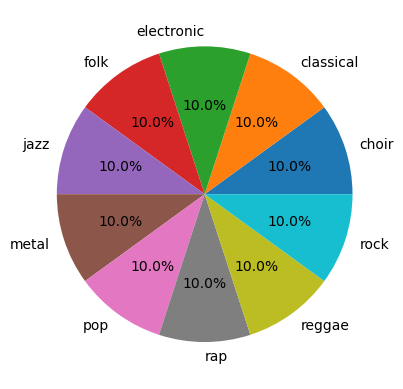

In [49]:
labels = df['Genre'].unique()
sizes = df.groupby(['Genre']).count()['Tempo']

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%')

plt.show()

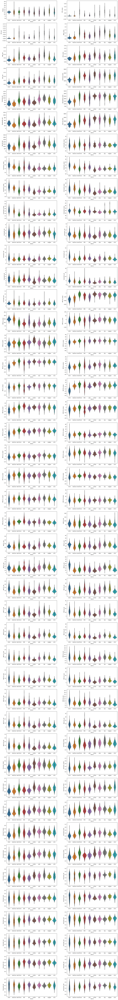

In [63]:
plt.figure(figsize=(20, 184), dpi=80)
nr = 1
for atr in df.columns[:-2]:
    plt.subplot(46, 2, nr)
    nr += 1
    sns.violinplot(data=df, x='Genre', y=atr)

<Axes: >

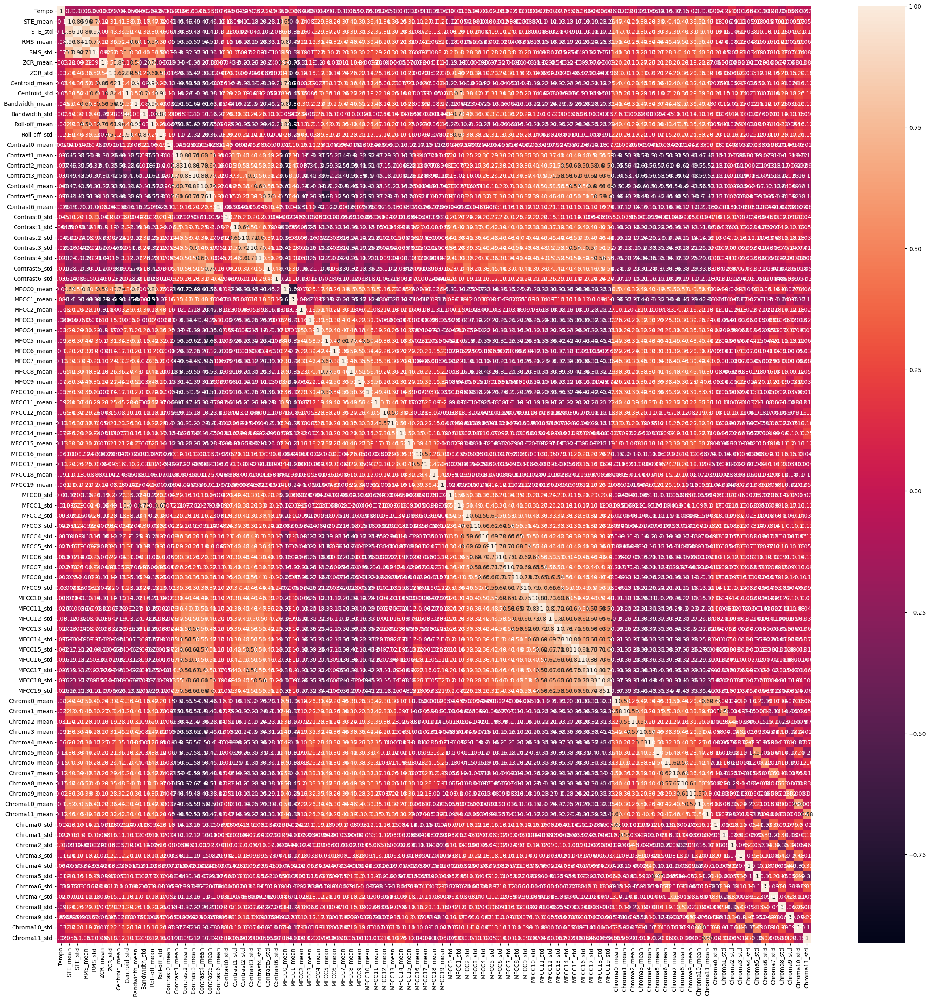

In [65]:
fig, ax = plt.subplots(figsize=(30, 30))
sns.heatmap(df.corr(numeric_only=True), annot=df.corr(numeric_only=True), ax=ax)

In [79]:
corr_matrix = df.corr(numeric_only=True).abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
threshold = 0.8
to_drop = [column for column in upper.columns if any(upper[column] > threshold)]

print(len(to_drop), "kolumn do usunięcia = ", to_drop)

20 kolumn do usunięcia =  ['STE_std', 'RMS_mean', 'RMS_std', 'Centroid_mean', 'Centroid_std', 'Bandwidth_mean', 'Roll-off_mean', 'Roll-off_std', 'Contrast2_mean', 'Contrast3_mean', 'Contrast4_mean', 'MFCC0_mean', 'MFCC1_mean', 'MFCC11_std', 'MFCC13_std', 'MFCC15_std', 'MFCC16_std', 'MFCC17_std', 'MFCC18_std', 'MFCC19_std']


In [80]:
df_nocorr = df.drop(to_drop, axis=1)

In [82]:
print('Liczba kolumn po usunięciu skolerowanych = ', df_nocorr.shape[1])
df_nocorr.head()

Liczba kolumn po usunięciu skolerowanych =  72


,Tempo,STE_mean,ZCR_mean,ZCR_std,Bandwidth_std,Contrast0_mean,Contrast1_mean,Contrast5_mean,Contrast6_mean,Contrast0_std,...,Chroma3_std,Chroma4_std,Chroma5_std,Chroma6_std,Chroma7_std,Chroma8_std,Chroma9_std,Chroma10_std,Chroma11_std,Genre
0,117.453835,0.002751,0.084384,0.031907,546.475523,29.507116,16.858170,27.175570,48.490185,6.152520,...,0.184830,0.251512,0.351089,0.188364,0.323224,0.192700,0.382898,0.313732,0.180709,choir
1,129.199219,0.002129,0.073145,0.035295,503.309131,27.492069,18.730857,26.730100,48.205636,6.341104,...,0.157749,0.278516,0.328153,0.221604,0.418387,0.204494,0.344287,0.273368,0.177349,choir
2,117.453835,0.003823,0.087358,0.027223,498.459158,29.143937,17.044031,27.616315,48.845899,5.845352,...,0.177687,0.215747,0.358452,0.233619,0.345665,0.211821,0.359942,0.316724,0.215014,choir
3,117.453835,0.002063,0.081553,0.035328,481.225069,27.005344,17.867018,26.629940,48.373345,6.569819,...,0.175896,0.229170,0.333000,0.220233,0.410388,0.211764,0.333863,0.271708,0.173406,choir
4,117.453835,0.003401,0.081016,0.030548,515.422504,28.922206,16.927557,26.781137,48.188748,6.062999,...,0.187950,0.220705,0.366815,0.208286,0.339201,0.195336,0.373781,0.308540,0.195019,choir


<Axes: >

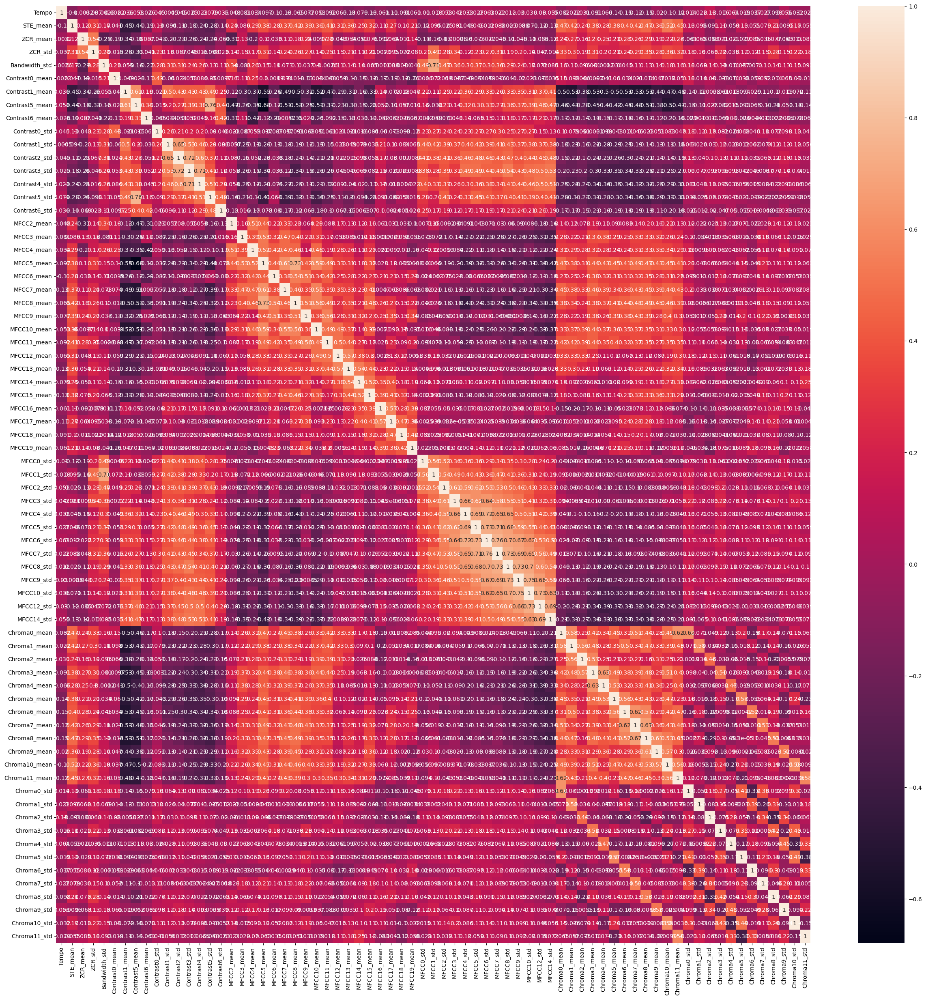

In [83]:
fig, ax = plt.subplots(figsize=(30, 30))
sns.heatmap(df_nocorr.corr(numeric_only=True), annot=df_nocorr.corr(numeric_only=True), ax=ax)

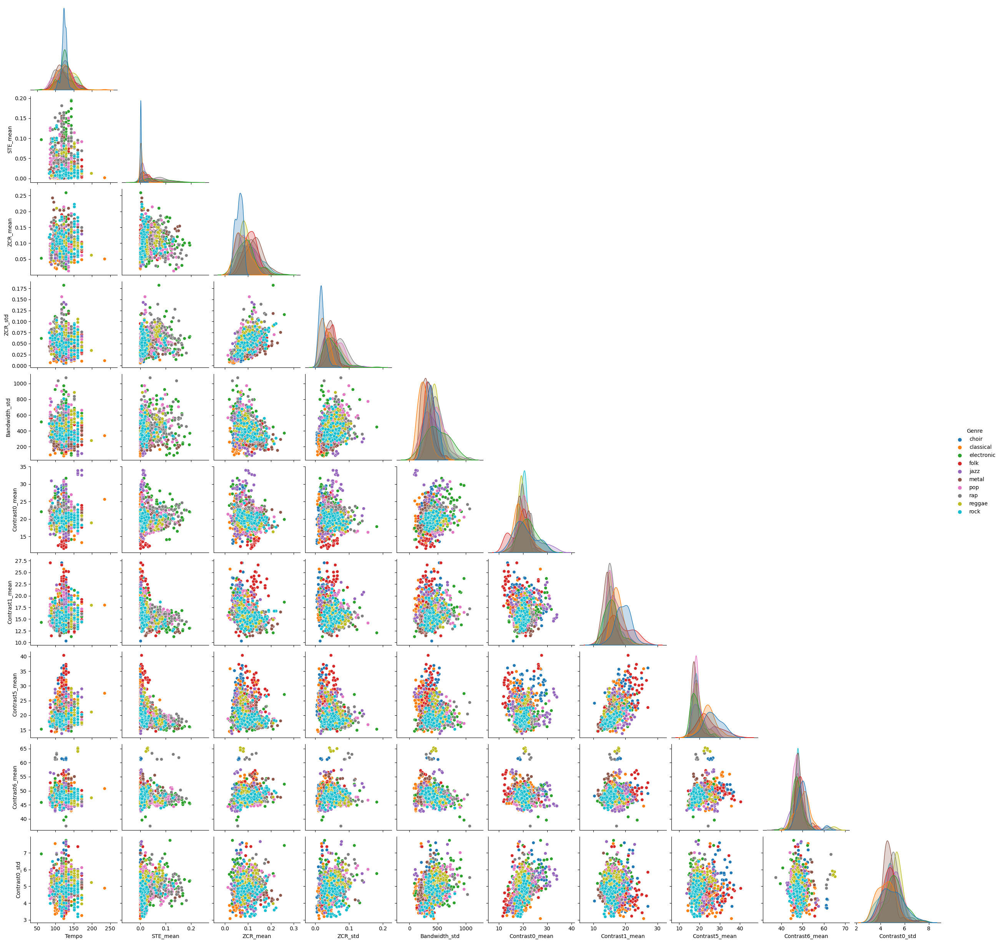

In [88]:
df_fragment = df_nocorr.iloc[:, 0:10]
df_fragment['Genre'] = df_nocorr['Genre']
sns.pairplot(df_fragment, kind="scatter", hue="Genre", corner=True)
plt.show()